# Differential expression between WT and KD within celltypes

In [1]:
here::i_am("rna_atac/differential/RNA.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(edgeR))


BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 21

# Multi core using future - built in to seurat
plan("multicore", workers = 16)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code



In [2]:
args = list()

# Metadata
args$metadata = file.path(io$basedir, 'results/rna_atac/clustering/metadata_celltype_annotated.txt.gz')

# RNA_sce
args$rna_sce = file.path(io$basedir, 'processed/rna/SingleCellExperiment.rds')

args$logFC_thr = 0.25
args$FDR_thr = 0.05

# outdir
args$outdir = file.path(io$basedir, 'results/rna_atac/differential/expression/')
dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

In [3]:
# Load meta
meta = fread(args$metadata)[day!='D3']

#### Load Data

In [4]:
# load sce
rna.sce <- load_SingleCellExperiment(args$rna_sce, normalise = TRUE, cells = meta$cell)
colData(rna.sce) = meta %>% as.data.frame() %>% tibble::column_to_rownames('cell') %>% DataFrame()

# Convert to Seurat
seurat = as.Seurat(rna.sce)

In [32]:
# Prepare mofa umap
umap.mtx = meta[,c('cell', 'UMAP1', 'UMAP2')] %>% 
    as.data.frame(.) %>% 
    tibble::column_to_rownames('cell') %>%
    as.matrix()
seurat[["umap"]] <- CreateDimReducObject(embeddings = umap.mtx, key = "umap_", assay = DefaultAssay(seurat))

In [6]:
Idents(seurat) = seurat@meta.data$genotype

#### Seurat

In [6]:
find_DEGs = function(celltype_test, logFC_thr = args$logFC_thr, FDR_thr = args$FDR_thr, test = 'wilcox'){
    message(celltype_test)
    tmp = seurat[, meta[celltype_v1==celltype_test]$cell]
    markers_tmp = FindMarkers(tmp, ident.1 = "KO", ident.2 = "WT",
      logfc.threshold = 0.1, test.use = test)
    tmp = as.data.table(markers_tmp, keep.rownames=T) %>%
        setnames('rn', 'gene') %>% 
        .[,sig:=ifelse(abs(avg_log2FC)>logFC_thr & p_val_adj <= FDR_thr, TRUE, FALSE)] %>% 
        .[,celltype:=celltype_test]
    return(tmp)
}  

# volcano plot
volcano_plot = function(dt, ntop=5, logFC_thr = args$logFC_thr, FDR_thr = args$FDR_thr, title=NULL){
    tmp = dt[,sign:=ifelse(p_val_adj < FDR_thr & abs(avg_log2FC) > logFC_thr, ifelse(avg_log2FC>0, 'pos', 'neg'), 'nonsig')] %>%
        .[order(-abs(avg_log2FC))]
    labels = tmp[, head(.SD, ntop),  by=sign][sign!='nonsig']
    
    p = ggplot(tmp, aes(avg_log2FC, -log10(p_val_adj), col=sign)) + 
        geom_point() +  
        scale_colour_manual(values=c('pos' = 'red', 'neg' = 'blue', 'nonsig' = 'black')) + 
        geom_vline(xintercept=c(-logFC_thr, logFC_thr),  linetype = "longdash") +
        geom_vline(xintercept=0, color='orange', linetype = "longdash") +
        geom_hline(yintercept=-log10(FDR_thr),  linetype = "longdash") + 
        ggrepel::geom_text_repel(data=labels, aes(label=gene), 
                                 color='black',
                                 size=5,
                                 box.padding = 0.5, 
                                 max.overlaps = Inf,
                                 bg.color='white', 
                                 bg.r = 0.1) + 
        xlim(c(-max(abs(tmp$avg_log2FC)), max(abs(tmp$avg_log2FC)))) + 
        ggtitle(title) + 
        theme_bw() + 
        theme(text = element_text(size=15, color='black'),
             axis.text = element_text(size=15, color='black'),
             legend.position = 'none',
             plot.title = element_text(hjust=0.5))

    
    return(p)
}

In [16]:
keep = unique(opts$clusters2celltypes)[unique(opts$clusters2celltypes) != 'Blood_Progenitor']

In [17]:
keep

[1] "Early_Mes_EOd"       "Primitive_Streak"    "HE"                 
 [4] "Posterior_Mes"       "Mesenchyme"          "Early_Mes_EOi"      
 [7] "Allantois"           "Allantois_Precursor" "HE_Precursor"       
[10] "Endothelium"

In [18]:
DEGs = mclapply(keep, find_DEGs, mc.cores=12) %>% rbindlist()

In [19]:
fwrite(DEGs, sprintf('%s/DEGs_seurat.txt.gz', args$outdir))

In [20]:
# Remove haemoglobin genes because useually batch effect
DEGs = DEGs[!gene %in% c('Hba-x', 'Hba-a1', 'Hba-a2', 'Hbb-bh1') ]

In [27]:
plots = mclapply(keep, function(x){
    tmp = DEGs[celltype==x]
    p = volcano_plot(tmp, ntop=10, title=x)
    return(p)
})

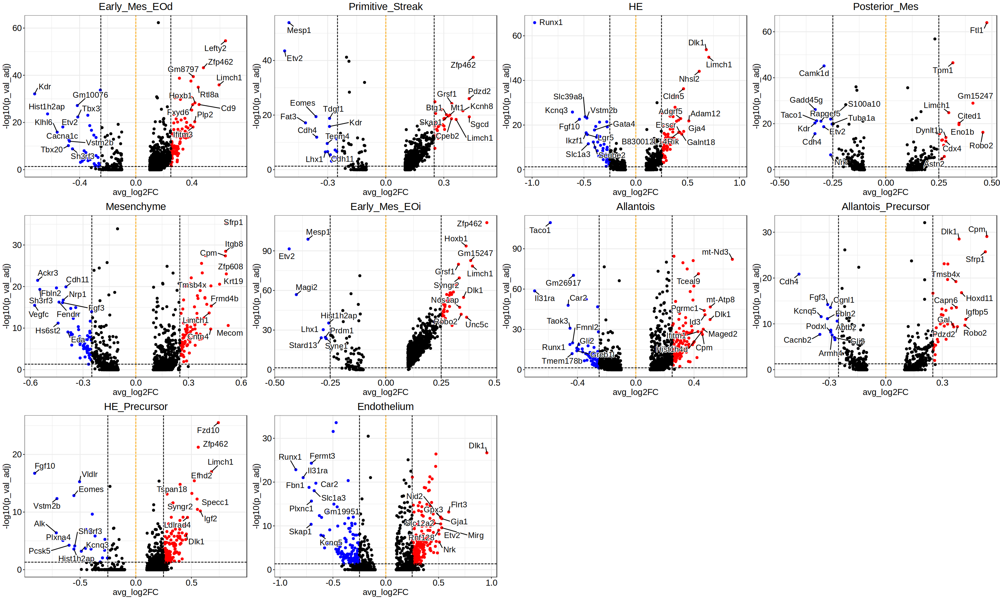

In [29]:
options(repr.plot.width=25, repr.plot.height=15)
ggarrange(plotlist=plots)

#### EdgeR

In [1]:
volcano_plot = function(dt, ntop=5, logFC_thr = args$logFC_thr, FDR_thr = args$FDR_thr, title=NULL){
    tmp = dt[,sign:=ifelse(padj_fdr < FDR_thr & abs(logFC) > logFC_thr, ifelse(logFC>0, 'pos', 'neg'), 'nonsig')] %>%
        .[order(-abs(logFC))]
    labels = tmp[, head(.SD, ntop),  by=sign][sign!='nonsig']
    
    p = ggplot(tmp, aes(logFC, -log10(padj_fdr), col=sign)) + 
        geom_point() + 
        scale_colour_manual(values=c('pos' = 'red', 'neg' = 'blue', 'nonsig' = 'black')) + 
        geom_vline(xintercept=c(-logFC_thr, logFC_thr),  linetype = "longdash") +
        geom_vline(xintercept=0, color='orange', linetype = "longdash") +
        geom_hline(yintercept=-log10(FDR_thr),  linetype = "longdash") + 
        ggrepel::geom_text_repel(data=labels, aes(label=gene), 
                                 color='black',
                                 size=5,
                                 box.padding = 0.5, 
                                 max.overlaps = Inf,
                                 bg.color='white', 
                                 bg.r = 0.1) + 
        xlim(c(-max(abs(tmp$logFC)), max(abs(tmp$logFC)))) + 
        ggtitle(title) + 
        theme_bw() + 
        theme(text = element_text(size=15, color='black'),
             axis.text = element_text(size=15, color='black'),
             legend.position = 'none',
              plot.title = element_text(hjust=0.5))
    
    return(p)
}

In [34]:
cell_metadata.dt = meta[day != 'D3']
cell_metadata.dt = cell_metadata.dt[,group:=paste0(celltype_v1, '.', genotype)]

args$min_cells = 25
args$fraction_cells_per_replicate = 0.4
args$nrep = 5
args$min_CDR = 0.35

# Define groups
opts$groups <- c(args$groupA,args$groupB)

In [37]:
table(cell_metadata.dt$group)


Allantois_Precursor.KO Allantois_Precursor.WT           Allantois.KO 
                  1389                    399                   1446 
          Allantois.WT    Blood_Progenitor.KO    Blood_Progenitor.WT 
                   429                      1                    244 
      Early_Mes_EOd.KO       Early_Mes_EOd.WT       Early_Mes_EOi.KO 
                   260                   5485                   3784 
      Early_Mes_EOi.WT         Endothelium.KO         Endothelium.WT 
                  1990                    431                    206 
       HE_Precursor.KO        HE_Precursor.WT                  HE.KO 
                   103                   1291                    377 
                 HE.WT          Mesenchyme.KO          Mesenchyme.WT 
                  1738                    317                   1676 
      Posterior_Mes.KO       Posterior_Mes.WT    Primitive_Streak.KO 
                  2908                    596                    840 
   Primitive_Streak

In [42]:
##################################
## Create pseudobulk replicates ##
##################################

cell2replicate.dt <- lapply(unique(cell_metadata.dt$group), function(i){
  tmp <- cell_metadata.dt[group==i]
  if ((args$fraction_cells_per_replicate*nrow(tmp))<=args$min_cells) {
    ncells_per_replicate <- args$min_cells
  } else {
    ncells_per_replicate <- round(args$fraction_cells_per_replicate*nrow(tmp))
  }
  seq(1,args$nrep) %>% map(function(j) {
    tmp[sample.int(nrow(tmp),ncells_per_replicate, replace=F)] %>% 
      .[,replicate:=sprintf("%s_rep%s",i,j)] %>%
      .[,c("cell","group","replicate")] %>% 
      return
  }) %>% rbindlist %>% return
}) %>% rbindlist

stats.dt <- cell2replicate.dt[,.(ncells=.N),c("group","replicate")]
print(stats.dt)

                   group                replicate ncells
  1:    Early_Mes_EOd.WT    Early_Mes_EOd.WT_rep1   2194
  2:    Early_Mes_EOd.WT    Early_Mes_EOd.WT_rep2   2194
  3:    Early_Mes_EOd.WT    Early_Mes_EOd.WT_rep3   2194
  4:    Early_Mes_EOd.WT    Early_Mes_EOd.WT_rep4   2194
  5:    Early_Mes_EOd.WT    Early_Mes_EOd.WT_rep5   2194
 ---                                                    
106: Blood_Progenitor.KO Blood_Progenitor.KO_rep1     25
107: Blood_Progenitor.KO Blood_Progenitor.KO_rep2     25
108: Blood_Progenitor.KO Blood_Progenitor.KO_rep3     25
109: Blood_Progenitor.KO Blood_Progenitor.KO_rep4     25
110: Blood_Progenitor.KO Blood_Progenitor.KO_rep5     25


In [44]:
##################################
## Create pseudobulk replicates ##
##################################

cell2replicate.dt <- lapply(unique(cell_metadata.dt$group), function(i){
  # Select group
  tmp <- cell_metadata.dt[group==i]
  # continue only if enough cells
  if ((args$fraction_cells_per_replicate*nrow(tmp))>=args$min_cells) {
      # determine nr cells per replicate
      ncells_per_replicate <- round(args$fraction_cells_per_replicate*nrow(tmp))
      # randomly sample cells
      seq(1,args$nrep) %>% map(function(j) {
        tmp[sample.int(nrow(tmp),ncells_per_replicate, replace=F)] %>% 
          .[,replicate:=sprintf("%s_rep%s",i,j)] %>%
          .[,c("cell","group","replicate")] %>% 
          return
  }) %>% rbindlist %>% return
}}) %>% rbindlist

stats.dt <- cell2replicate.dt[,.(ncells=.N),c("group","replicate")]
print(stats.dt)

                group             replicate ncells
  1: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep1   2194
  2: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep2   2194
  3: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep3   2194
  4: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep4   2194
  5: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep5   2194
 ---                                              
101:     Allantois.KO     Allantois.KO_rep1    578
102:     Allantois.KO     Allantois.KO_rep2    578
103:     Allantois.KO     Allantois.KO_rep3    578
104:     Allantois.KO     Allantois.KO_rep4    578
105:     Allantois.KO     Allantois.KO_rep5    578


In [46]:
# Create new SCE to prepare for pseudobulking
sce = as.SingleCellExperiment(seurat)[,cell2replicate.dt$cell]
sce$group_by <- cell2replicate.dt$replicate

In [47]:
################
## Pseudobulk ##
################

sce_pseudobulk <- pseudobulk_sce_fn(
  x = sce,
  assay = "counts",
  by = "group_by",
  fun = "sum",
  scale = FALSE
)

assayNames(sce_pseudobulk) <- "counts"

In [49]:
###################
## Normalisation ##
###################

# log cpm
logcounts(sce_pseudobulk) <- log2(1e6*(sweep(counts(sce_pseudobulk),2,colSums(counts(sce_pseudobulk)),"/"))+1)

In [64]:
args$groupA = 'WT'
args$groupB = 'KO'
args$celltypes = unique(opts$clusters2celltypes)[unique(opts$clusters2celltypes) != 'Blood_Progenitor']
opts$groups = c(args$groupA, args$groupB)

In [51]:
sce_full = sce_pseudobulk
rm(sce_pseudobulk)

In [73]:
sce_full$celltype_v1 <- colnames(sce_full) %>% strsplit("\\.") %>% map_chr(1)
sce_full$genotype <- colnames(sce_full) %>% strsplit("\\.") %>% map_chr(2) %>% strsplit('_rep') %>% map_chr(1)
sce_full$celltype_genotype = paste0(sce_full$celltype_v1, '_', sce_full$genotype)

In [74]:
keep = args$celltypes

In [97]:
singlecell_sce = as.SingleCellExperiment(seurat)

In [76]:
summary(colnames(singlecell_sce) == cell_metadata.dt$cell)

   Mode    TRUE 
logical   27135 

In [98]:
singlecell_sce

class: SingleCellExperiment 
dim: 32285 27135 
metadata(0):
assays(2): counts logcounts
rownames(32285): Xkr4 Gm1992 ... AC234645.1 AC149090.1
rowData names(0):
colnames(27135): 2_Eo_DEG_G9_day3_5_VC#AAACAGCCAAAGCGGC-1
  2_Eo_DEG_G9_day3_5_VC#AAACAGCCAACCTAAT-1 ...
  rv_eo_deg_day4_dtag#TTTGTGTTCATTTGTC-1
  rv_eo_deg_day4_dtag#TTTGTTGGTACTTAGG-1
colData names(29): orig.ident nCount_RNA ... celltypes_genotype ident
reducedDimNames(1): UMAP
mainExpName: RNA
altExpNames(0):

In [149]:
DEGs = mclapply(keep, function(ct, min.expr = 0.5, min.cdr = 0.3){
    tmp <- sprintf("%s_%s",ct,opts$groups)
    if (any(!tmp%in%unique(sce_full$celltype_genotype))) {
      warning("...")
      out <- data.table(gene=NA, logFC=NA, padj_fdr=NA, mean_groupA = NA, mean_groupB = NA, cdr_groupA=NA, cdr_groupB=NA)
    } else {
      message(ct)
      sce <- sce_full[,sce_full$celltype_v1 %in% ct]
      singlecell_sce <- rna.sce[,rna.sce$celltype_v1 %in% ct]
      singlecell_sce$celltype_genotype = sprintf("%s_%s",ct,singlecell_sce$genotype)
        # subset genotypes
        stopifnot(opts$groups%in%sce$genotype)
        sce$genotype <- factor(sce$genotype, levels=opts$groups)

        #######################################
        ## Calculate Cellular Detection Rate ##
        #######################################

        expr.dt <- data.table(
          gene = rownames(rna.sce),
          mean_groupA = rowMeans(logcounts(sce[,sce$genotype == args$groupA])) %>% round(2),
          mean_groupB = rowMeans(logcounts(sce[,sce$genotype == args$groupB])) %>% round(2),
          cdr_groupA = rowMeans(logcounts(singlecell_sce[,singlecell_sce$genotype == args$groupA])>0) %>% round(2),
          cdr_groupB = rowMeans(logcounts(singlecell_sce[,singlecell_sce$genotype == args$groupB])>0) %>% round(2)
        )

        #######################
        ## Feature selection ##
        #######################
        # filter genes
        genes.to.use <- expr.dt[mean_groupA>=min.expr | mean_groupB>=min.expr,][cdr_groupA>=min.cdr | cdr_groupB>=min.cdr,gene]
        genes.to.use = genes.to.use[!genes.to.use %in% genes.to.use[grep("*Rik|^Gm|^Rps|^Rpl|^Olfr", genes.to.use)]]

        ################################################
        ## Differential expression testing with edgeR ##
        ################################################

        # Convert SCE to DGEList
        sce_edger <- scran::convertTo(sce[genes.to.use,], type="edgeR")
        
        # Calculate Normalisation Factors
        sce_edger <- calcNormFactors(sce_edger)
        
        # Define design matrix (with intercept)
        design <- model.matrix(~sce$genotype)

        # Estimate dispersions
        sce_edger  <- estimateDisp(sce_edger,design)

        # Fit GLM
        fit <- glmQLFit(sce_edger,design)

        # Likelihood ratio test
        lrt <- glmQLFTest(fit)

        # Construct output data.frame
        out <- topTags(lrt, n=nrow(lrt))$table %>% as.data.table(keep.rownames=T) %>%
          setnames(c("gene","logFC","logCPM","LR","p.value","padj_fdr")) %>%
          .[,c("logCPM","LR","p.value"):=NULL] %>%
          .[,c("padj_fdr","logFC"):=list(signif(padj_fdr,digits=3), round(logFC,3))] %>%
          merge(expr.dt, by="gene", all.y=TRUE) %>%
          setorder(padj_fdr, na.last=T)
    }
    out = out %>% .[,celltype:=ct]
    return(out)
}, mc.cores=1) %>% rbindlist(., fill=TRUE)

Early_Mes_EOd

Primitive_Streak

HE

Posterior_Mes

Mesenchyme

Early_Mes_EOi

Allantois

Allantois_Precursor

HE_Precursor

Endothelium



In [150]:
fwrite(DEGs, sprintf('%s/DEGs_edgeR_pb.txt.gz', args$outdir))

In [4]:
DEGs = fread(sprintf('%s/DEGs_edgeR_pb.txt.gz', args$outdir))

In [5]:
DEGs = DEGs[!gene %in% c('Hba-x', 'Hba-a1', 'Hba-a2', 'Hbb-bh1') ]

In [8]:
DEGs[grep('Zic', gene)][!is.na(logFC)]

gene,logFC,padj_fdr,mean_groupA,mean_groupB,cdr_groupA,cdr_groupB,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
Zic3,0.490,9.56e-05,4.18,4.67,0.16,0.31,Early_Mes_EOd
Zic5,0.114,1.42e-01,5.18,5.32,0.29,0.38,Primitive_Streak
Zic3,-0.009,9.28e-01,5.12,5.13,0.28,0.34,Primitive_Streak


In [156]:
plots = mclapply(keep, function(x){
    tmp = DEGs[celltype==x][!is.na(logFC)]
    p = volcano_plot(tmp, ntop=10, title=x, logFC_thr=0.75)
    return(p)
})

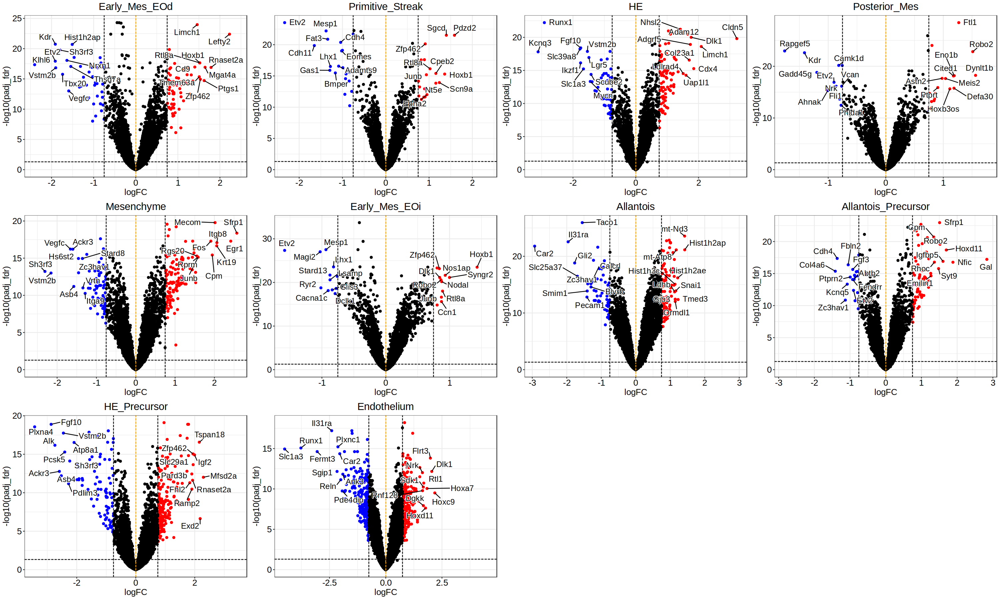

In [157]:
options(repr.plot.width=25, repr.plot.height=15)
ggarrange(plotlist=plots)

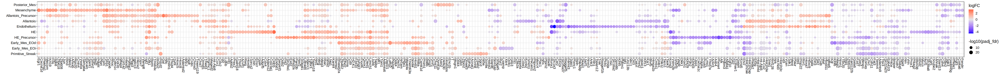

In [158]:
features = unique(DEGs[padj_fdr<0.05 & abs(logFC) > 0.75] %>% .[order(-abs(logFC)), ] %>% .[,head(.SD, 50), by=celltype] %>% .$gene)

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = opts$celltype_levels)]

options(repr.plot.width=50, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

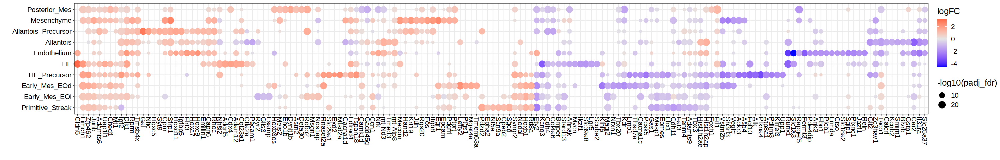

In [165]:
features = unique(DEGs[padj_fdr<0.05 & abs(logFC) > 0.75] %>% .[order(-abs(logFC)), ] %>% .[,head(.SD, 20), by=celltype] %>% .$gene)

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = opts$celltype_levels)]

options(repr.plot.width=25, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

In [9]:
opts$celltype_levels

[1] "Primitive_Streak"    "Early_Mes_EOi"       "Early_Mes_EOd"      
 [4] "HE_Precursor"        "HE"                  "Blood_Progenitor"   
 [7] "Endothelium"         "Allantois"           "Allantois_Precursor"
[10] "Mesenchyme"          "Posterior_Mes"

In [10]:
opts$celltype_levels2 = c('Allantois','Allantois_Precursor','Posterior_Mes','Mesenchyme','Early_Mes_EOi','Primitive_Streak','Early_Mes_EOd','HE_Precursor','HE','Blood_Progenitor', 'Endothelium')

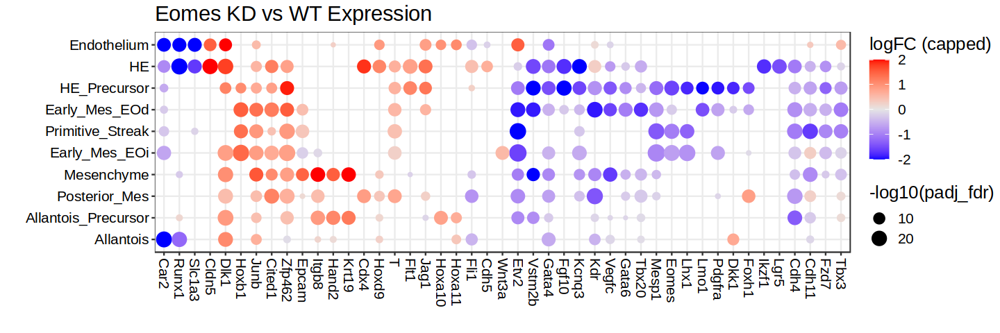

In [11]:
features = c('Kdr', 'Fgf10', 'Runx1', 'Cdh5', 'T', 'Eomes', 'Dlk1', 'Epcam', 
             'Lgr5', 'Itgb8', 'Cited1', 'Flt1', 'Jag1', 'Cdx4', 'Hoxb1', 'Junb', 'Tbx3', 'Pdgfra', 'Mesp1', 'Mesp2', 
             'Vstm2b', 'Kcnq3', 'Hoxd9', 'Hoxa10', 'Etv2',
             'Gata6', 'Gata4', 'Lhx1', 'Fli1', 'Wnt3a', 'Zfp462', 'Vegfc', 'Ikzf1', 'Flt3', 'Hoxa11', 
             'Tbx20', 'Lmo1', 'Foxh1', 'Dkk1', 'Car2', 'Slc1a3', 'Hoxb1', 'Cldn5', 'Hand2', 'Cdh4', 'Krt19','Fzd7', 'Cdh11')

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = opts$celltype_levels2)] %>% 
    .[, logFC_capped := ifelse(logFC >= 2, 2, 
                               ifelse(logFC <= -2, -2, logFC))]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT Expression') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

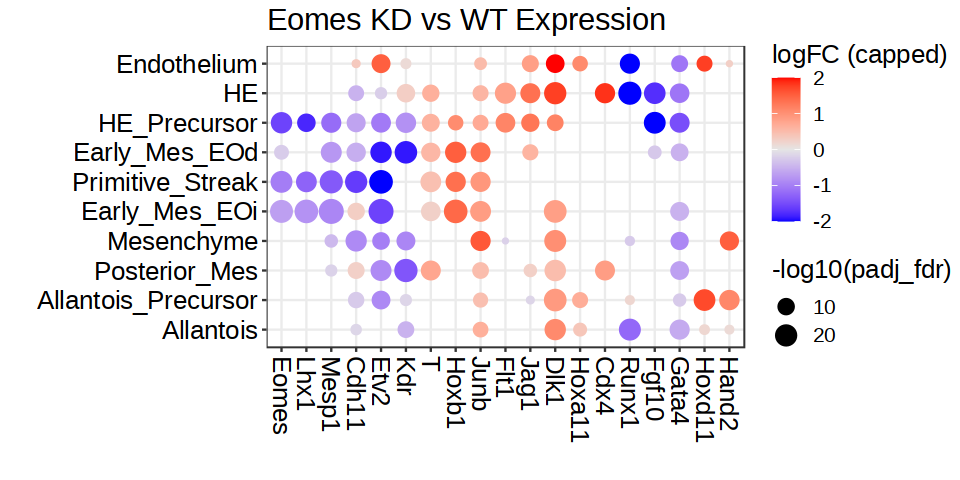

In [13]:
features = c('Eomes','Lhx1', 'Mesp1', 'Cdh11', 'Etv2', 'Kdr',
             'T', 'Hoxb1', 'Junb',
             'Flt1','Jag1', 'Dlk1', 'Hoxa11', 'Cdx4', 
             'Runx1', 'Fgf10', 'Gata4', 
             'Hoxd11', 'Hand2')

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = features)] %>%
    .[, celltype := factor(celltype, levels = opts$celltype_levels2)] %>% 
    .[, logFC_capped := ifelse(logFC >= 2, 2, 
                               ifelse(logFC <= -2, -2, logFC))]

options(repr.plot.width=8, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT Expression') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=15, color='black'),
         text=element_text(size=15))

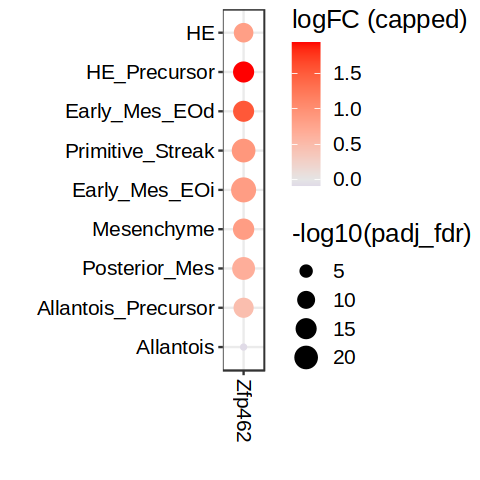

In [27]:
features = c('Zfp462')

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene)] %>%
    .[, celltype := factor(celltype, levels = opts$celltype_levels2)] %>% 
    .[, logFC_capped := ifelse(logFC >= 2, 2, 
                               ifelse(logFC <= -2, -2, logFC))]

options(repr.plot.width=4, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    #ggtitle('Eomes KD vs WT Expression') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

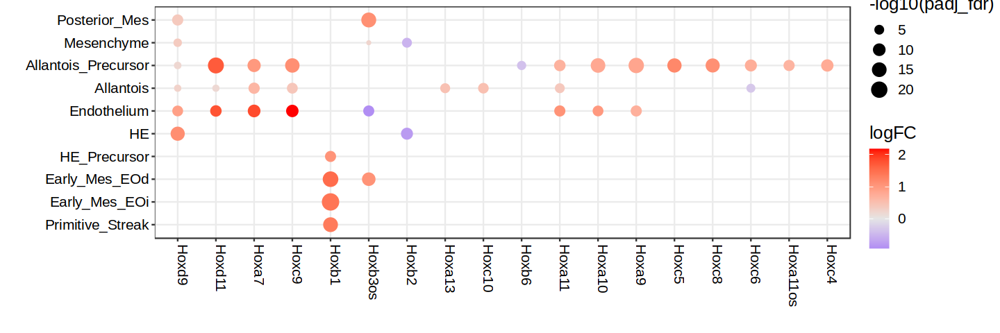

In [180]:
# all Hox genes
features = unique(DEGs$gene)[grep('^Hox', unique(DEGs$gene))]

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = opts$celltype_levels)]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

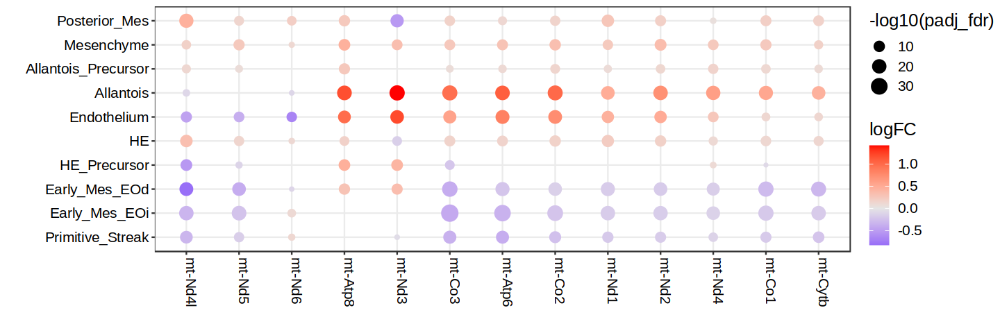

In [181]:
# all Hox genes
features = unique(DEGs$gene)[grep('^mt-', unique(DEGs$gene))]

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = opts$celltype_levels)]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot[padj_fdr < 0.05], aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

### EdgeR single-cell

In [29]:
args$groupA = 'WT'
args$groupB = 'KO'
args$celltypes = unique(opts$clusters2celltypes)[unique(opts$clusters2celltypes) != 'Blood_Progenitor']
opts$groups = c(args$groupA, args$groupB)

keep = args$celltypes 

In [15]:
sce = as.SingleCellExperiment(seurat)

In [16]:
sample_metadata = meta[day!='D3']

In [32]:
# Single cell DEG function
doDiffExpr <- function(sce, groups, min.expr = 0.3, min.cdr = 0.3) {
    
  # Sanity checks
  if (!is(sce, "SingleCellExperiment")) stop("'sce' has to be an instance of SingleCellExperiment")
  stopifnot(length(groups)==2)

  # Filter genes by detection rate per group
#  cdr_A <- rowMeans(counts(sce[,sce$genotype==opts$groups[1]])>0) >= min_detection_rate_per_group
#  cdr_B <- rowMeans(counts(sce[,sce$genotype==opts$groups[2]])>0) >= min_detection_rate_per_group
    expr.dt <- data.table(
        gene = rownames(rna.sce),
        mean_groupA = rowMeans(logcounts(sce[,sce$genotype == args$groupA])) %>% round(2),
        mean_groupB = rowMeans(logcounts(sce[,sce$genotype == args$groupB])) %>% round(2),
        cdr_groupA = rowMeans(logcounts(sce[,sce$genotype == args$groupA])>0) %>% round(2),
        cdr_groupB = rowMeans(logcounts(sce[,sce$genotype == args$groupB])>0) %>% round(2)
    )

    #######################
    ## Feature selection ##
    #######################
    # filter genes
    genes.to.use <- expr.dt[mean_groupA>=min.expr | mean_groupB>=min.expr,][cdr_groupA>=min.cdr | cdr_groupB>=min.cdr,gene]
    genes.to.use = genes.to.use[!genes.to.use %in% genes.to.use[grep("*Rik|^Gm|^Rps|^Rpl|^Olfr", genes.to.use)]]  
    message(length(genes.to.use))
  #out <- .edgeR(sce[cdr_B | cdr_A,]) %>% .[,log_padj_fdr:= -log10(padj_fdr)]
  out <- .edgeR(sce[genes.to.use,]) %>% .[,log_padj_fdr:= -log10(padj_fdr)]
  
  return(out)
}


.edgeR <- function(sce) {
  
  # Convert SCE to DGEList
  sce$genotype <- factor(sce$genotype, levels=opts$groups)
  sce_edger <- scran::convertTo(sce, type="edgeR")
    
  # Calculate Normalisation Factors
  sce_edger <- calcNormFactors(sce_edger)

  design <- model.matrix(~sce$genotype) # might need to modify to only use this if celltype found in both experiments
  # Estimate dispersions
  sce_edger  <- estimateDisp(sce_edger,design)
  
  # Fit GLM
  fit <- glmQLFit(sce_edger,design)
  
  # Likelihood ratio test
  lrt <- glmQLFTest(fit)
  
  # Construct output data.frame
  out <- topTags(lrt, n=nrow(lrt))$table %>% as.data.table(keep.rownames=T) %>%
    setnames(c("gene","logFC","logCPM","LR","p.value","padj_fdr")) %>%
    .[,c("logCPM","LR"):=NULL]
  
  return(out)
}

In [35]:
# Single_cell

sce$group = meta$genotype
opts$groups = c('WT', 'KO')
sce$group = factor(sce$group, levels = opts$groups)

DEGs = mclapply(keep, function(x){     #unique(meta$celltype.mapped)
    # Only keep cell types with at least 20 cells in both KO and WT
    if(!TRUE %in% as.vector(as.data.frame(table(meta[celltype_v1==x, genotype]))$Freq<20) & 
       length(unique(meta[celltype_v1==x, genotype]))==2){
        message(x)
        sce_deg = sce[, meta$celltype_v1==x]
            out <- doDiffExpr(sce_deg, opts$groups) %>%
              # Add sample statistics
              .[,c("groupA_N","groupB_N"):=list(table(sce_deg$group)[1],table(sce_deg$group)[2])]%>% 
              .[,c("groupA","groupB", "celltype"):=list(opts$groups[1],opts$groups[2],x)]%>%  
              # Calculate statistical significance
              .[, sig := (padj_fdr<=0.05 & abs(logFC)>=1)] %>%
              .[is.na(sig),sig:=FALSE] %>% 
              setorder(-sig, padj_fdr, na.last=T) %>%
              # Add celltype
                .[,celltype:=x]

            # Parse columns
            out[,c("p.value","padj_fdr","logFC","log_padj_fdr"):=list(signif(p.value,digits=3), signif(padj_fdr,digits=3), round(logFC,3),round(log_padj_fdr,3))]
            return(out)
            } 
        }, mc.cores=12) %>% rbindlist()


In [36]:
fwrite(DEGs, sprintf('%s/DEGs_edgeR_sc.txt.gz', args$outdir))

In [4]:
DEGs = fread(sprintf('%s/DEGs_edgeR_sc.txt.gz', args$outdir))

In [5]:
DEGs = DEGs[!gene %in% c('Hba-x', 'Hba-a1', 'Hba-a2', 'Hbb-bh1') ]

In [74]:
plots = lapply(keep, function(x){
    tmp = DEGs[celltype==x][!is.na(logFC)]
    p = volcano_plot(tmp, ntop=10, title=x, logFC_thr=0.5)
    return(p)
})

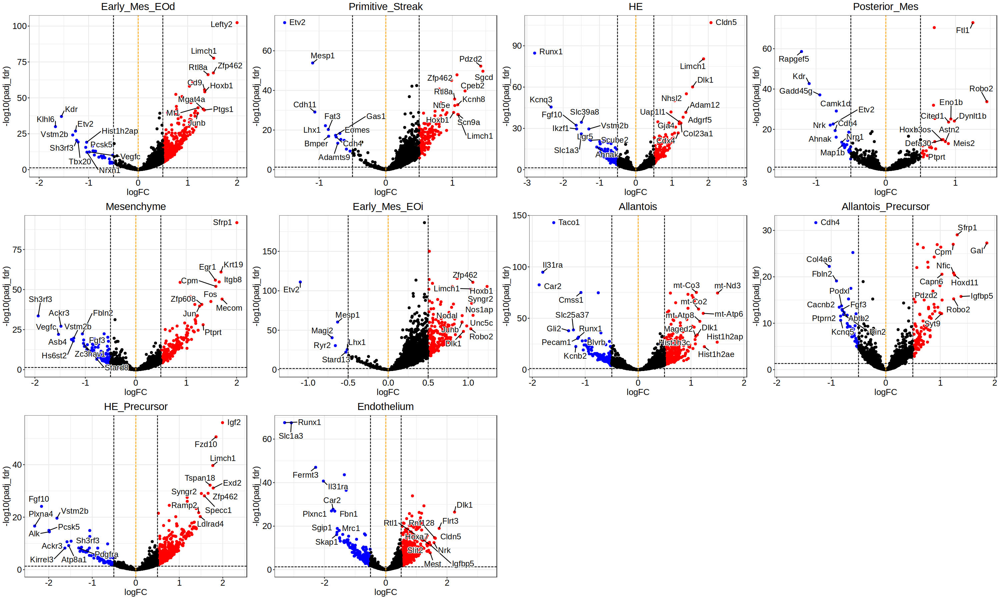

In [75]:
options(repr.plot.width=25, repr.plot.height=15)
ggarrange(plotlist=plots)

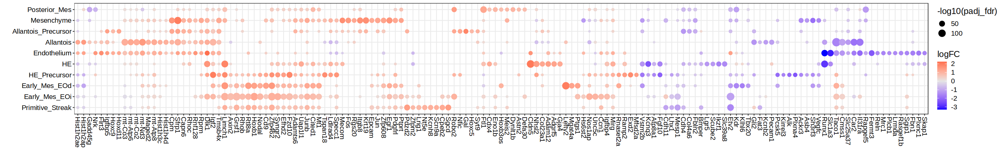

In [76]:
features = unique(DEGs[padj_fdr<0.05 & abs(logFC) > 0.75] %>% .[order(-abs(logFC)), ]) %>% .[,head(.SD, 20), by=celltype] %>% .$gene

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = opts$celltype_levels)]

options(repr.plot.width=25, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

Lots of Mt genes in Allantois, possibly actually altered metabolic activity in these cells, or increased cell death?
--> look for death scores?

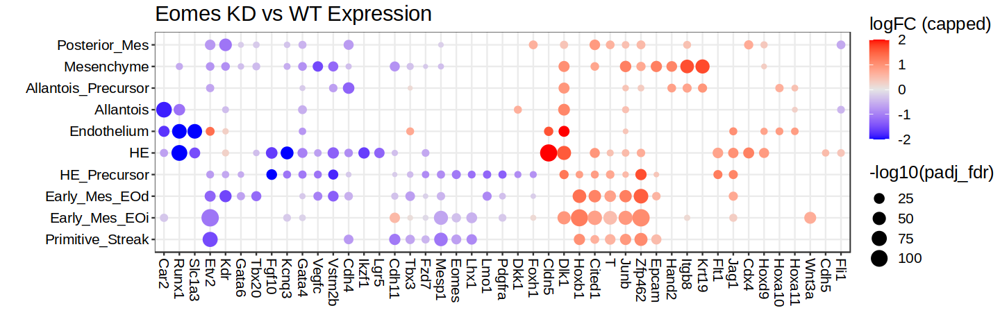

In [77]:
features = c('Kdr', 'Fgf10', 'Runx1', 'Cdh5', 'T', 'Eomes', 'Dlk1', 'Epcam', 
             'Lgr5', 'Itgb8', 'Cited1', 'Flt1', 'Jag1', 'Cdx4', 'Hoxb1', 'Junb', 'Tbx3', 'Pdgfra', 'Mesp1', 'Mesp2', 
             'Vstm2b', 'Kcnq3', 'Hoxd9', 'Hoxa10', 'Etv2',
             'Gata6', 'Gata4', 'Lhx1', 'Fli1', 'Wnt3a', 'Zfp462', 'Vegfc', 'Ikzf1', 'Flt3', 'Hoxa11', 
             'Tbx20', 'Lmo1', 'Foxh1', 'Dkk1', 'Car2', 'Slc1a3', 'Hoxb1', 'Cldn5', 'Hand2', 'Cdh4', 'Krt19','Fzd7', 'Cdh11')

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = opts$celltype_levels)] %>% 
    .[, logFC_capped := ifelse(logFC >= 2, 2, 
                               ifelse(logFC <= -2, -2, logFC))]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT Expression') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

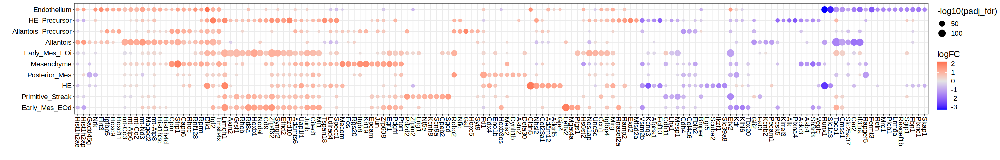

In [80]:
features = unique(DEGs[padj_fdr<0.05 & abs(logFC) > 0.75] %>% .[order(-abs(logFC)), ]) %>% .[,head(.SD, 20), by=celltype] %>% .$gene

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = keep)]

options(repr.plot.width=25, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

# Plot genes

In [7]:
gene = 'Zfp462'

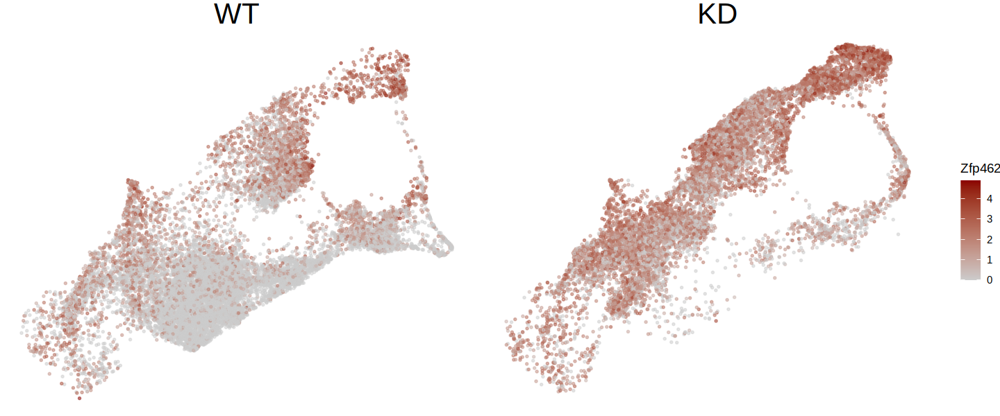

In [8]:
meta$gene = as.vector(logcounts(rna.sce[gene,]))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))]
options(repr.plot.width=12, repr.plot.height=5)
ggplot(meta, aes(UMAP1, UMAP2, col=gene)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradient(low='grey80', high='darkred', name=gene) + 
    facet_wrap(~genotype) + 
    theme_void() + 
    theme(strip.text=element_text(size=25))

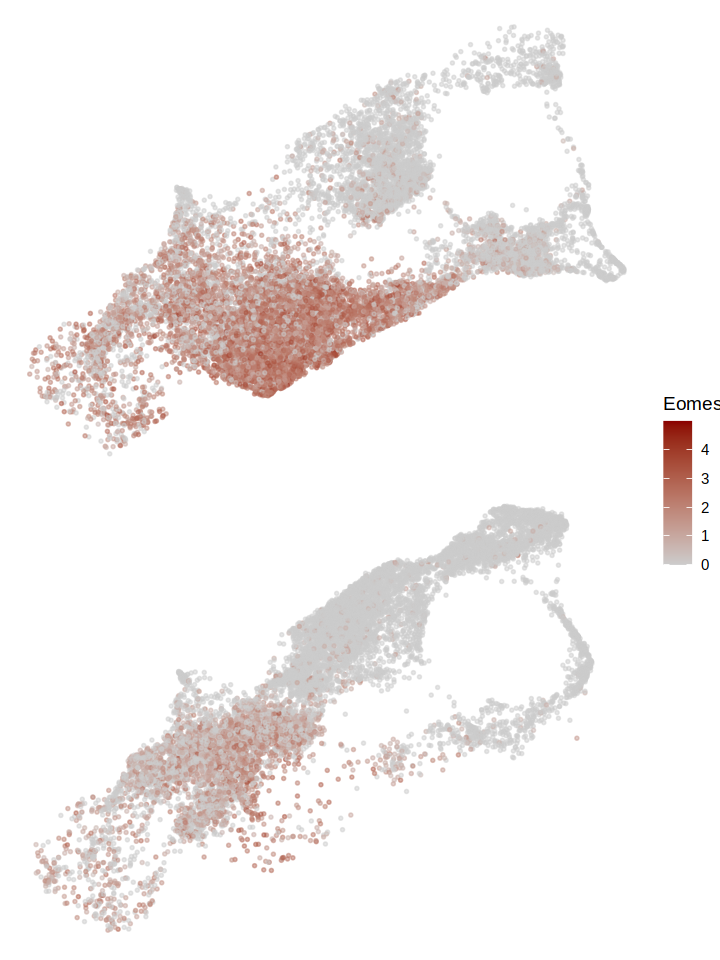

In [13]:
gene = 'Eomes'

meta$gene = as.vector(logcounts(rna.sce[gene,]))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))]
options(repr.plot.width=6, repr.plot.height=8)
ggplot(meta, aes(UMAP1, UMAP2, col=gene)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradient(low='grey80', high='darkred', name=gene) + 
    facet_wrap(~genotype, ncol=1) + 
    theme_void() + 
    theme(strip.text=element_blank())

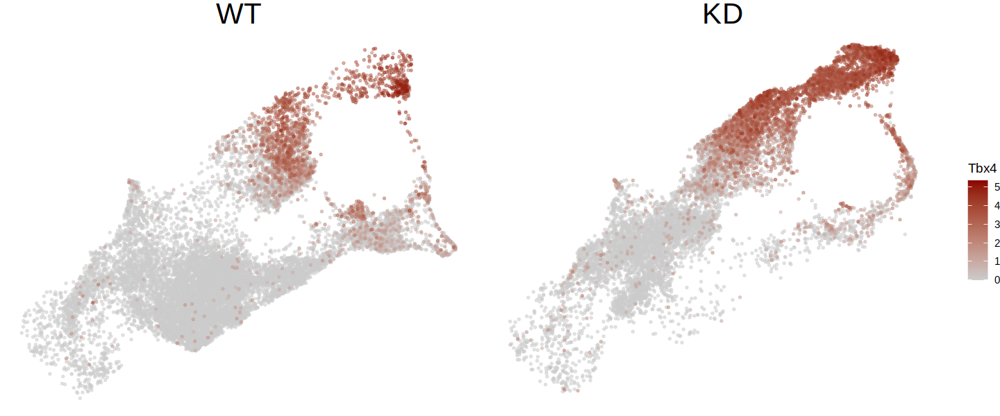

In [5]:
gene = 'Tbx4'

meta$gene = as.vector(logcounts(rna.sce[gene,]))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(gene)]
options(repr.plot.width=12, repr.plot.height=5)
ggplot(meta, aes(UMAP1, UMAP2, col=gene)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradient(low='grey80', high='darkred', name=gene) + 
    facet_wrap(~genotype) + 
    theme_void() + 
    theme(strip.text=element_text(size=25))

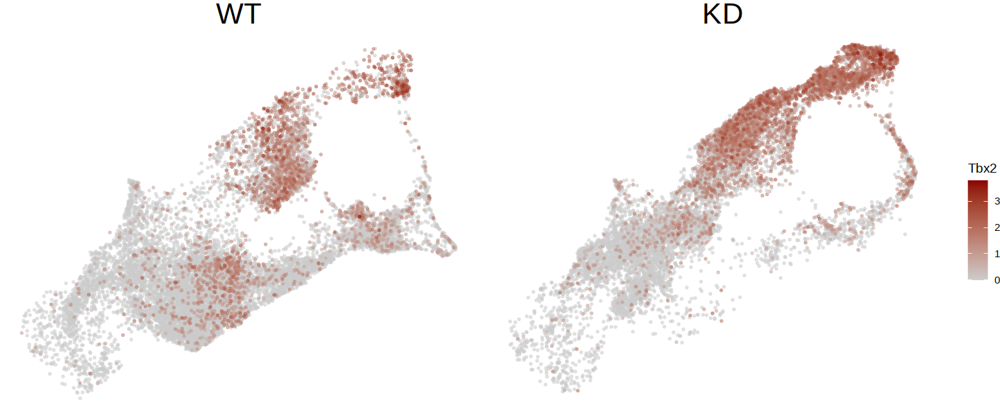

In [5]:
gene = 'Tbx2'

meta$gene = as.vector(logcounts(rna.sce[gene,]))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(gene)]
options(repr.plot.width=12, repr.plot.height=5)
ggplot(meta, aes(UMAP1, UMAP2, col=gene)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradient(low='grey80', high='darkred', name=gene) + 
    facet_wrap(~genotype) + 
    theme_void() + 
    theme(strip.text=element_text(size=25))

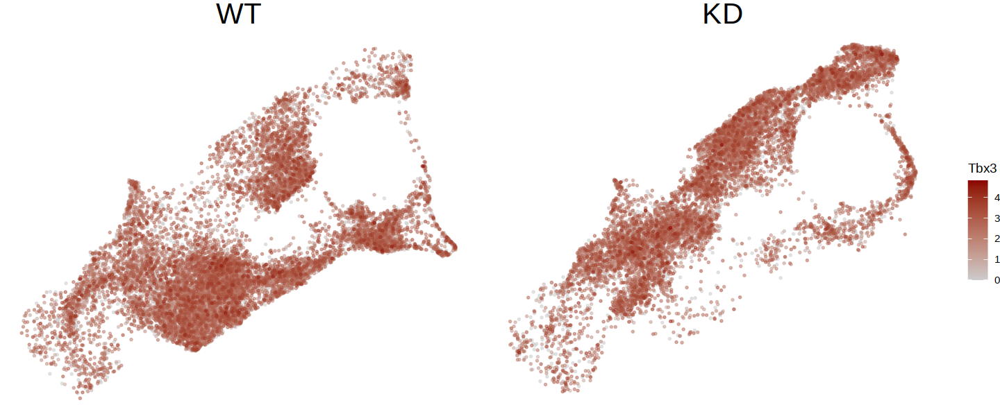

In [9]:
gene = 'Tbx3'

meta$gene = as.vector(logcounts(rna.sce[gene,]))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(gene)]
options(repr.plot.width=12, repr.plot.height=5)
ggplot(meta, aes(UMAP1, UMAP2, col=gene)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradient(low='grey80', high='darkred', name=gene) + 
    facet_wrap(~genotype) + 
    theme_void() + 
    theme(strip.text=element_text(size=25))

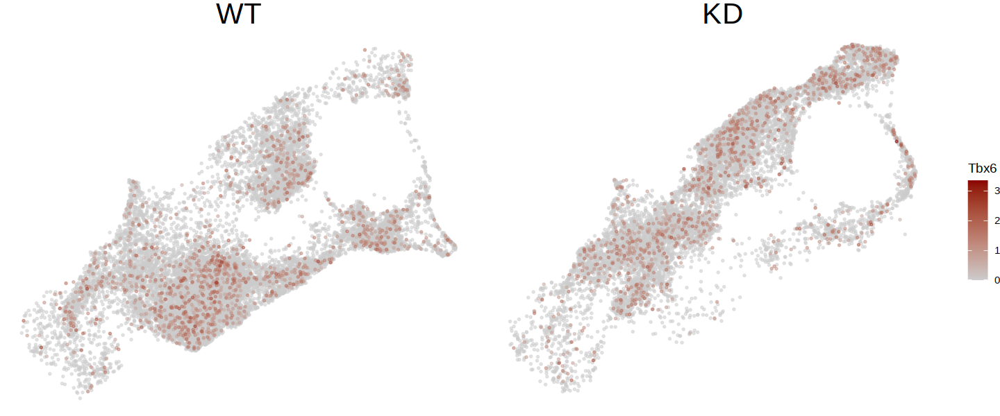

In [7]:
gene = 'Tbx6'

meta$gene = as.vector(logcounts(rna.sce[gene,]))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(gene)]
options(repr.plot.width=12, repr.plot.height=5)
ggplot(meta, aes(UMAP1, UMAP2, col=gene)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradient(low='grey80', high='darkred', name=gene) + 
    facet_wrap(~genotype) + 
    theme_void() + 
    theme(strip.text=element_text(size=25))

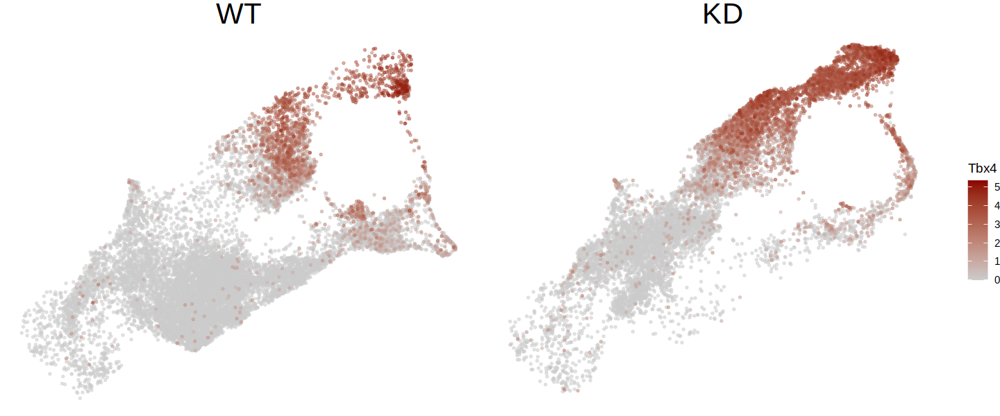

In [5]:
gene = 'Tbx4'

meta$gene = as.vector(logcounts(rna.sce[gene,]))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(gene)]
options(repr.plot.width=12, repr.plot.height=5)
ggplot(meta, aes(UMAP1, UMAP2, col=gene)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradient(low='grey80', high='darkred', name=gene) + 
    facet_wrap(~genotype) + 
    theme_void() + 
    theme(strip.text=element_text(size=25))

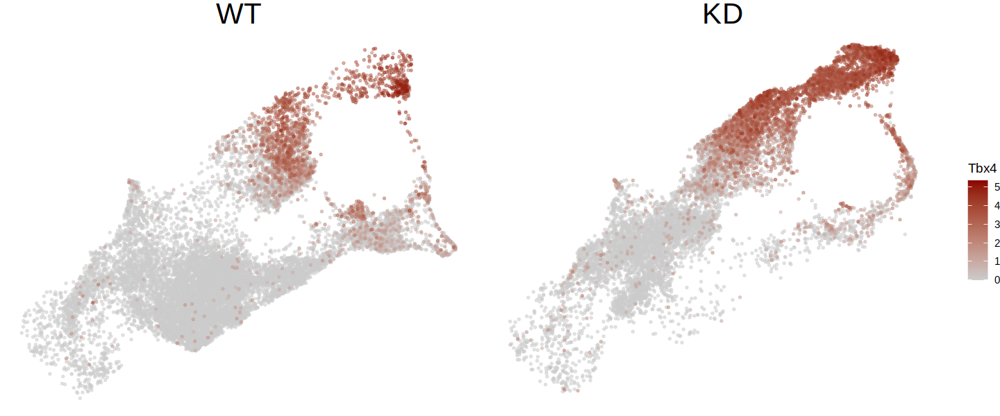

In [5]:
gene = 'Tbx4'

meta$gene = as.vector(logcounts(rna.sce[gene,]))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(gene)]
options(repr.plot.width=12, repr.plot.height=5)
ggplot(meta, aes(UMAP1, UMAP2, col=gene)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradient(low='grey80', high='darkred', name=gene) + 
    facet_wrap(~genotype) + 
    theme_void() + 
    theme(strip.text=element_text(size=25))

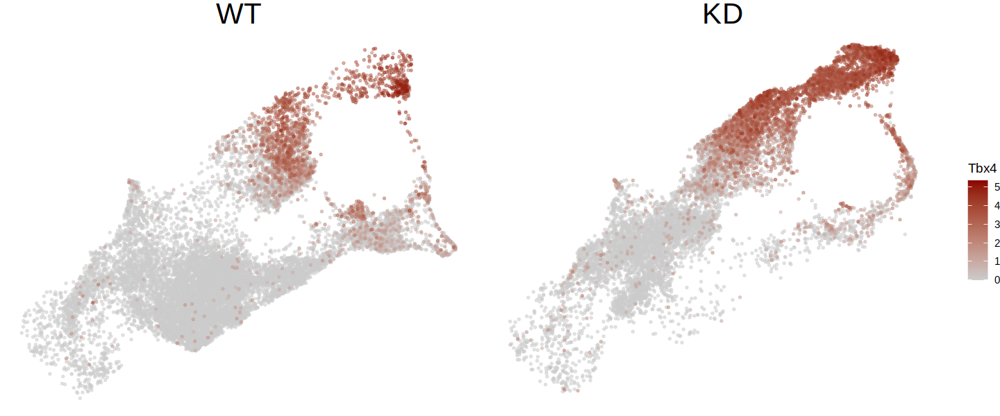

In [5]:
gene = 'Tbx4'

meta$gene = as.vector(logcounts(rna.sce[gene,]))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(gene)]
options(repr.plot.width=12, repr.plot.height=5)
ggplot(meta, aes(UMAP1, UMAP2, col=gene)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradient(low='grey80', high='darkred', name=gene) + 
    facet_wrap(~genotype) + 
    theme_void() + 
    theme(strip.text=element_text(size=25))

In [35]:
summary(colnames(rna.sce) == meta$cell)

   Mode   FALSE 
logical   27135 

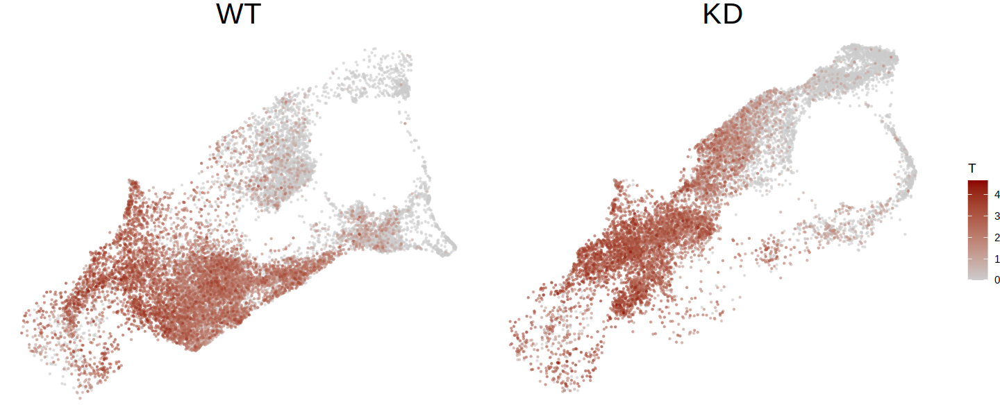

In [37]:
gene = 'T'
meta = meta[match(colnames(rna.sce), cell)]
meta$gene = as.vector(logcounts(rna.sce[gene,]))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(gene)]
options(repr.plot.width=12, repr.plot.height=5)
ggplot(meta, aes(UMAP1, UMAP2, col=gene)) + 
    geom_point(size=0.2, alpha=0.5) +
    scale_color_gradient(low='grey80', high='darkred', name=gene) + 
    facet_wrap(~genotype) + 
    theme_void() + 
    theme(strip.text=element_text(size=25))

Warning message:
“Groups with fewer than two data points have been dropped.”


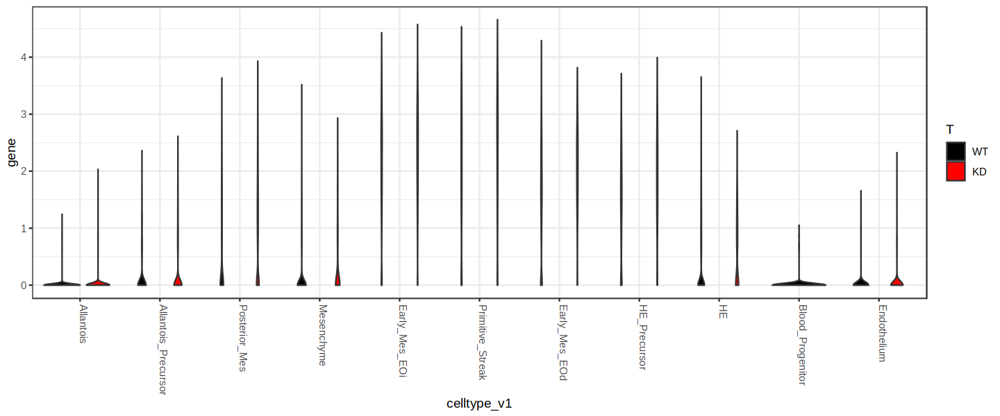

In [38]:
ggplot(meta[, celltype_v1 := factor(celltype_v1, levels=opts$celltype_levels2)], aes(celltype_v1, gene, fill=genotype)) + 
    geom_violin() +
    scale_fill_manual(values=c(opts$genotype.colors, 'KD'= 'red'), name=gene) + 
   # facet_wrap(~genotype) + 
    theme_bw() + 
    theme(strip.text=element_text(size=25),
         axis.text.x = element_text(angle=-90, hjust=0, vjust=0))